# Pipeline A

## Stage 1 - Data Extraction
This stage reads image records from the final dataset without modifying files.

In [1]:
from pathlib import Path
import importlib
import os
import sys

import cv2
import matplotlib.pyplot as plt
import pandas as pd

PROJECT_ROOT = next(path for path in [Path.cwd(), *Path.cwd().parents] if (path / 'src').is_dir())
if str(PROJECT_ROOT / 'src') not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT / 'src'))

import shared.initial_image_standardization as standardization
importlib.reload(standardization)
from shared.initial_image_standardization import (
    DEFAULT_TARGET_SIZE, PADDING_VALUE, find_small_images, get_sample_images,
    inspect_image_sizes, print_dataset_summary, scan_dataset, standardize_image,
)

DATASET_ROOT = Path(os.environ.get('DATASET_ROOT', r'C:\Users\Hwang\Downloads\final_dataset'))
image_records = scan_dataset(DATASET_ROOT)
train_records = [record for record in image_records if record['split'] == 'train']
validation_records = [record for record in image_records if record['split'] == 'validation']
test_records = [record for record in image_records if record['split'] == 'test']

print(f'Train images: {len(train_records)}')
print(f'Validation images: {len(validation_records)}')
print(f'Reserved test images (untouched): {len(test_records)}')


Train images: 38937
Validation images: 5553
Reserved test images (untouched): 6519


## Stage 2 - Initial Image Standardization

This stage reads the extracted dataset without changing it. Images are resized to **512 x 512** with aspect-ratio preservation, no crop, no stretch, `cv2.INTER_AREA` when shrinking, `cv2.INTER_CUBIC` when enlarging, and neutral-gray `(114, 114, 114)` letterbox padding.

### Dataset and dimension statistics
The checks below only report unclassified images, they do not delete or modify files.

In [2]:
print_dataset_summary(image_records)
size_stats = inspect_image_sizes(train_records)
print('\nTraining-set dimension statistics')
for key in ('minimum_width', 'maximum_width', 'average_width', 'minimum_height', 'maximum_height', 'average_height', 'unreadable_image_count'):
    print(f'{key}: {size_stats[key]}')
print('Most common training resolutions (width, height):')
for resolution, count in size_stats['most_common_resolutions']:
    print(f'  {resolution}: {count}')

small_train_images = find_small_images(train_records)
print(f'\nTraining images below 64 x 64: {len(small_train_images)}')
for record in small_train_images:
    print(f"{record['path']} ({record['width']} x {record['height']})")


Total images: 51009
Single-fruit images: 47729
Multiple-fruit images: 3280
Train images: 38937
Validation images: 5553
Test images: 6519
Unclassified images: 0

Training-set dimension statistics
minimum_width: 16
maximum_width: 5184
average_width: 473.89655083853404
minimum_height: 8
maximum_height: 4608
average_height: 488.5043275034029
unreadable_image_count: 0
Most common training resolutions (width, height):
  (256, 256): 10735
  (640, 640): 5833
  (800, 800): 2903
  (224, 224): 1038
  (1020, 1020): 588
  (800, 600): 530
  (1280, 1024): 468
  (192, 256): 267
  (3456, 4608): 249
  (4608, 3456): 229

Training images below 64 x 64: 1062
C:\Users\Hwang\Downloads\final_dataset\single_fruit\train\Apple\Ripe\killa92_Apple_Ripe_0011212_crop002.jpg (59 x 89)
C:\Users\Hwang\Downloads\final_dataset\single_fruit\train\Apple\Ripe\killa92_Apple_Ripe_0019254_crop004.jpg (59 x 75)
C:\Users\Hwang\Downloads\final_dataset\single_fruit\train\Apple\Ripe\killa92_Apple_Ripe_0019254_crop007.jpg (53 x 51)


Target size: (512, 512); padding value: (114, 114, 114)


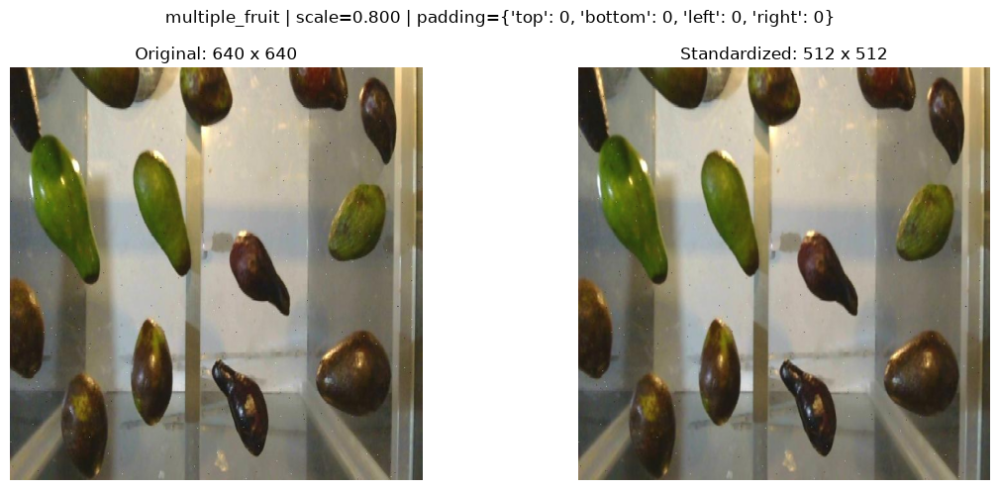

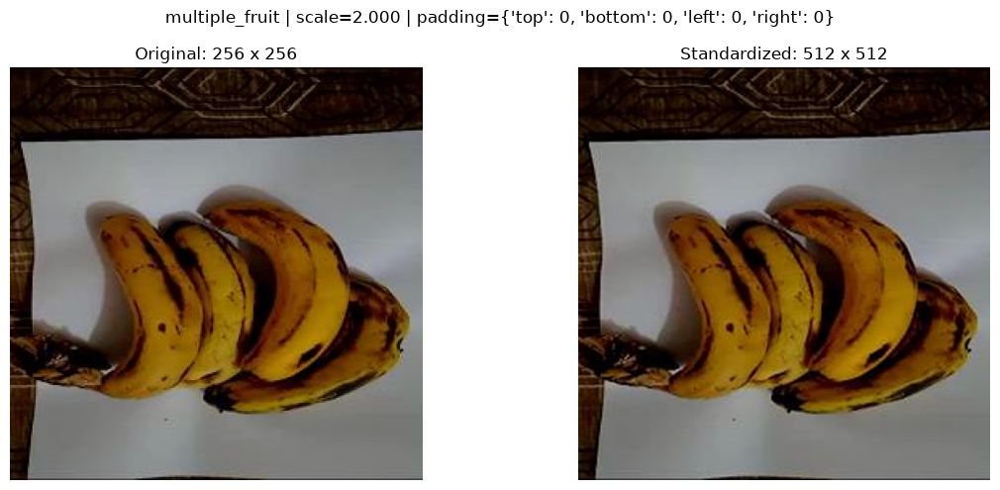

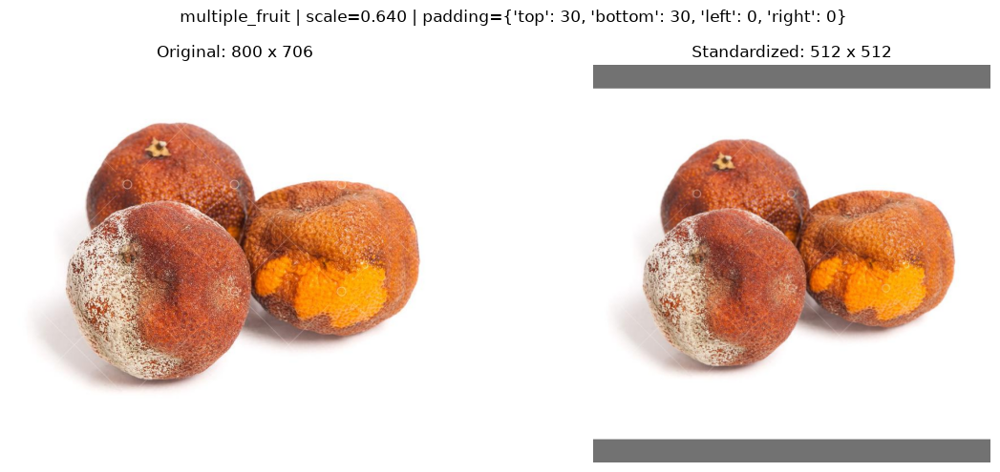

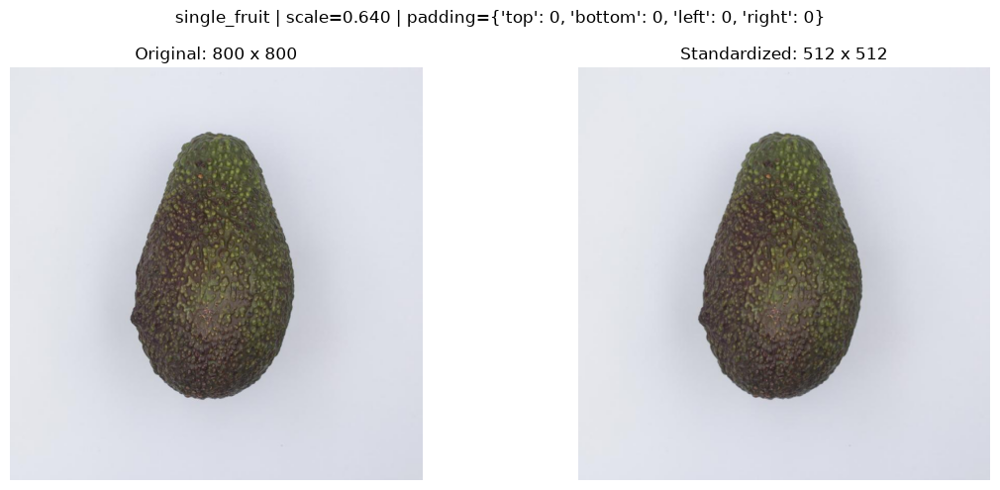

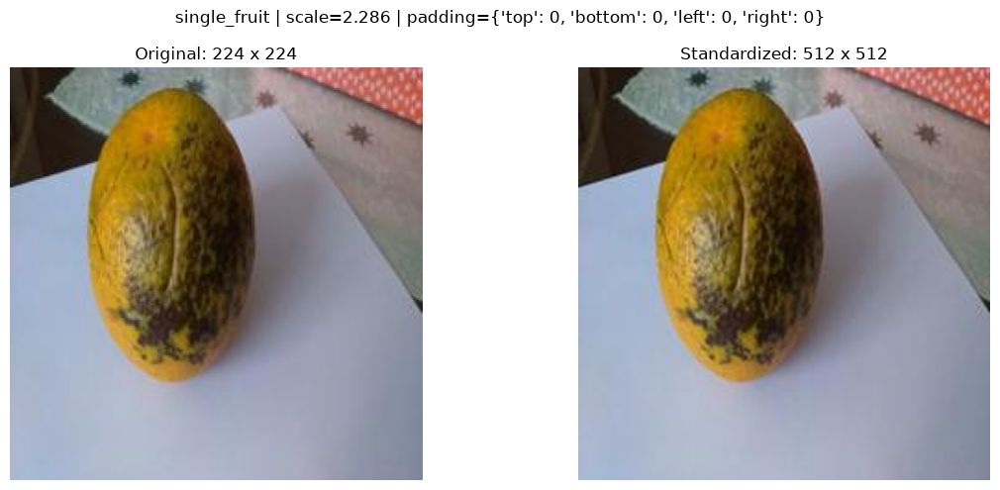

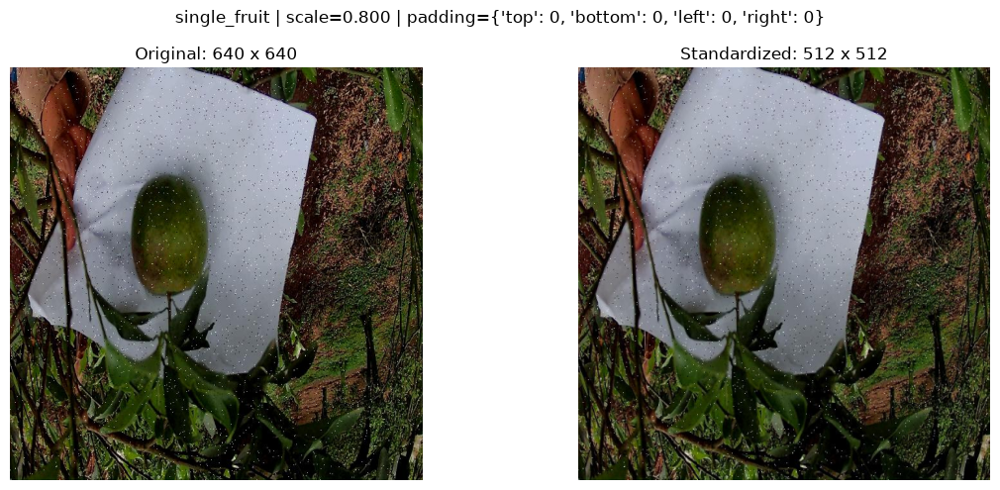

Standardized training images: 38937


In [2]:
TARGET_SIZE = DEFAULT_TARGET_SIZE  # (512, 512)
print(f'Target size: {TARGET_SIZE}; padding value: {PADDING_VALUE}')
train_sample_records = get_sample_images(train_records, single_count=3, multiple_count=3, seed=42)
train_sample_paths = {record['path'] for record in train_sample_records}
standardized_train_images = 0

for record in train_records:
    original, standardized, metadata = standardize_image(record['path'], TARGET_SIZE)
    if standardized is None:
        print(f"Skipped unreadable training image: {record['path']}")
        continue

    standardized_train_images += 1
    if record['path'] not in train_sample_paths:
        continue

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    axes[0].set_title(f"Original: {metadata['original_size'][0]} x {metadata['original_size'][1]}")
    axes[1].imshow(cv2.cvtColor(standardized, cv2.COLOR_BGR2RGB))
    axes[1].set_title(f"Standardized: {metadata['target_size'][0]} x {metadata['target_size'][1]}")
    for axis in axes:
        axis.axis('off')
    fig.suptitle(f"{record['fruit_group']} | scale={metadata['scale_factor']:.3f} | padding={metadata['padding']}")
    plt.tight_layout()
    plt.show()

print(f'Standardized training images: {standardized_train_images}')


## Stage 3 - Preprocessing
**Technique:** Noise Reduction  
**Algorithm:** Median Filter  

Median Filter is used to reduce noise while preserving important fruit boundaries and surface details for later segmentation and feature extraction.

**Supporting Article:**  
Roza et al. (2024) applied Median Filter for mango quality and ripeness image processing. DOI: https://doi.org/10.37985/jer.v5i4.1863 

**Parameter Tuning:**
The kernel sizes **3 × 3** and **5 × 5** are compared using the validation set. The better-performing kernel is selected and locked for Pipeline A.

**Evaluation Metrics:**

| Metric | Purpose | Better |
|---|---|---|
| BRISQUE | Perceptual image quality | ↓ Lower |
| NIQE | Natural image quality | ↓ Lower |
| PIQE | Image distortion | ↓ Lower |
| SSIM | Structural preservation | ↑ Higher |
| Processing Time | Efficiency | ↓ Lower |

The average validation results are used to select the final Median Filter kernel size.

**Evaluation Metric References:**  
Close-up hyperspectral image focus stacking through Laplacian pyramid fusion (2026)  
DOI: [https://doi.org/10.1364/OE.588317](https://doi.org/10.1364/OE.588317)  
Supports: BRISQUE, NIQE, PIQE, and Processing Time.

A conditional segmentation-guided network for pomegranate image completion under occlusion (2025)  
DOI: [https://doi.org/10.1186/s13007-025-01476-4](https://doi.org/10.1186/s13007-025-01476-4)  
Supports: SSIM, BRISQUE, NIQE, and Inference Time.

In [4]:
# Tune 3 x 3 versus 5 x 5 median filtering on every VALIDATION image
import preprocessing.preprocessing_a as preprocessing_a
importlib.reload(preprocessing_a)
from preprocessing.preprocessing_a import preprocess_image
from evaluation.preprocessing_metrics import evaluate_preprocessing

CANDIDATE_KERNEL_SIZES = (3, 5)
metric_names = ('brisque', 'niqe', 'piqe', 'ssim', 'processing_time_seconds')
metric_totals = {kernel: {name: 0.0 for name in metric_names} for kernel in CANDIDATE_KERNEL_SIZES}
images_evaluated = {kernel: 0 for kernel in CANDIDATE_KERNEL_SIZES}
skipped_metric_images = {kernel: 0 for kernel in CANDIDATE_KERNEL_SIZES}

for index, record in enumerate(validation_records, start=1):
    _, standardized, _ = standardize_image(record['path'], TARGET_SIZE)
    if standardized is None:
        for kernel in CANDIDATE_KERNEL_SIZES:
            skipped_metric_images[kernel] += 1
        continue

    for kernel in CANDIDATE_KERNEL_SIZES:
        filtered, preprocessing_metadata = preprocess_image(standardized, kernel)
        try:
            scores = evaluate_preprocessing(
                standardized, filtered, preprocessing_metadata['processing_time_seconds']
            )
        except Exception as error:
            skipped_metric_images[kernel] += 1
            print(f"Skipped metrics for {record['path']} at {kernel} x {kernel}: {error}")
            continue

        for name in metric_names:
            metric_totals[kernel][name] += scores[name]
        images_evaluated[kernel] += 1

    if index % 100 == 0:
        print(f'Validation images processed: {index}/{len(validation_records)}')

tuning_rows = []
for kernel in CANDIDATE_KERNEL_SIZES:
    if images_evaluated[kernel] == 0:
        raise RuntimeError(f'No validation images were evaluated for {kernel} x {kernel}.')
    averages = {name: metric_totals[kernel][name] / images_evaluated[kernel] for name in metric_names}
    tuning_rows.append({
        'Kernel': f'{kernel} x {kernel}',
        'Images Evaluated': images_evaluated[kernel],
        'Avg BRISQUE ↓': averages['brisque'],
        'Avg NIQE ↓': averages['niqe'],
        'Avg PIQE ↓': averages['piqe'],
        'Avg SSIM ↑': averages['ssim'],
        'Avg Time (ms) ↓': averages['processing_time_seconds'] * 1000,
        'kernel_size': kernel,
    })

tuning_table = pd.DataFrame(tuning_rows)
display(tuning_table.drop(columns='kernel_size').round({
    'Avg BRISQUE ↓': 3, 'Avg NIQE ↓': 3, 'Avg PIQE ↓': 3,
    'Avg SSIM ↑': 4, 'Avg Time (ms) ↓': 3,
}))

# Balance all five metrics using ranks; no single metric decides the kernel.
ranking = tuning_table.set_index('kernel_size')[[
    'Avg BRISQUE ↓', 'Avg NIQE ↓', 'Avg PIQE ↓', 'Avg SSIM ↑', 'Avg Time (ms) ↓'
]]
metric_ranks = pd.DataFrame({
    'brisque_rank': ranking['Avg BRISQUE ↓'].rank(ascending=True),
    'niqe_rank': ranking['Avg NIQE ↓'].rank(ascending=True),
    'piqe_rank': ranking['Avg PIQE ↓'].rank(ascending=True),
    'ssim_rank': ranking['Avg SSIM ↑'].rank(ascending=False),
    'time_rank': ranking['Avg Time (ms) ↓'].rank(ascending=True),
})
metric_ranks['balanced_rank'] = metric_ranks.mean(axis=1)
MEDIAN_KERNEL_SIZE = int(metric_ranks['balanced_rank'].idxmin())
print(f'Locked median-filter kernel: {MEDIAN_KERNEL_SIZE} x {MEDIAN_KERNEL_SIZE}')
display(metric_ranks.sort_values('balanced_rank'))


Validation images processed: 100/5553
Validation images processed: 200/5553
Validation images processed: 300/5553
Validation images processed: 400/5553
Validation images processed: 500/5553
Validation images processed: 600/5553
Validation images processed: 700/5553
Validation images processed: 800/5553
Validation images processed: 900/5553
Validation images processed: 1000/5553
Validation images processed: 1100/5553
Validation images processed: 1200/5553
Validation images processed: 1300/5553
Validation images processed: 1400/5553
Validation images processed: 1500/5553
Validation images processed: 1600/5553
Validation images processed: 1700/5553
Validation images processed: 1800/5553
Validation images processed: 1900/5553
Validation images processed: 2000/5553
Validation images processed: 2100/5553
Validation images processed: 2200/5553
Validation images processed: 2300/5553
Validation images processed: 2400/5553
Validation images processed: 2500/5553
Validation images processed: 2600/

,Kernel,Images Evaluated,Avg BRISQUE ↓,Avg NIQE ↓,Avg PIQE ↓,Avg SSIM ↑,Avg Time (ms) ↓
0,3 x 3,5553,60.609,7.975,68.616,0.9637,0.181
1,5 x 5,5553,66.918,8.914,77.096,0.9411,1.450


Locked median-filter kernel: 3 x 3


,brisque_rank,niqe_rank,piqe_rank,ssim_rank,time_rank,balanced_rank
kernel_size,,,,,,
3,1.0,1.0,1.0,1.0,1.0,1.0
5,2.0,2.0,2.0,2.0,2.0,2.0


In [ ]:
# Save Tune Results
from pathlib import Path

OUTPUT_DIR = Path("../results/pipeline_a/preprocessing")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# Save average tuning results
tuning_table.to_csv(
    OUTPUT_DIR / "median_filter_tuning_results.csv",
    index=False
)

# Save ranking results
metric_ranks.to_csv(
    OUTPUT_DIR / "median_filter_ranking.csv"
)

# Save locked parameter
with open(OUTPUT_DIR / "locked_median_parameter.txt", "w") as file:
    file.write(f"Median Filter Kernel Size: {MEDIAN_KERNEL_SIZE} x {MEDIAN_KERNEL_SIZE}\n")

print("Preprocessing tuning results saved.")
print(f"Locked kernel: {MEDIAN_KERNEL_SIZE} x {MEDIAN_KERNEL_SIZE}")

Preprocessing tuning results saved.
Locked kernel: 3 x 3


Loaded locked Median Filter kernel: 3 x 3


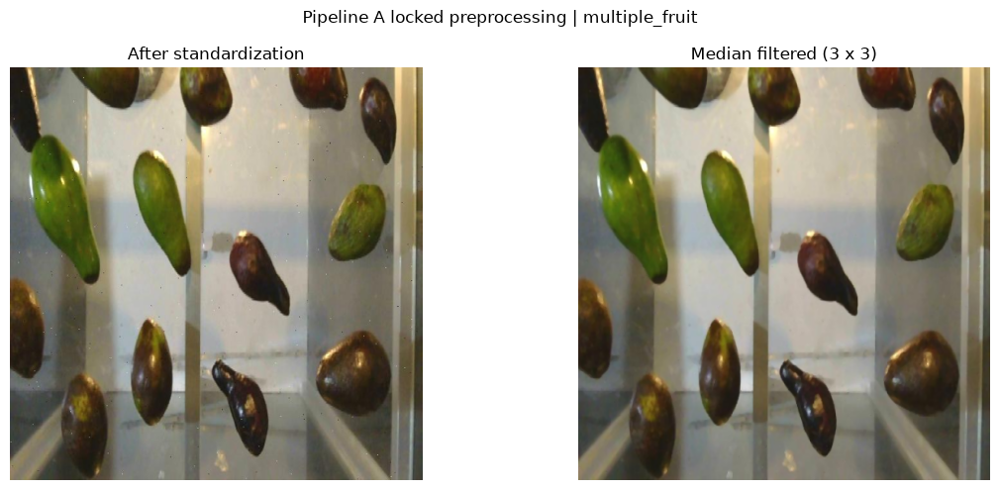

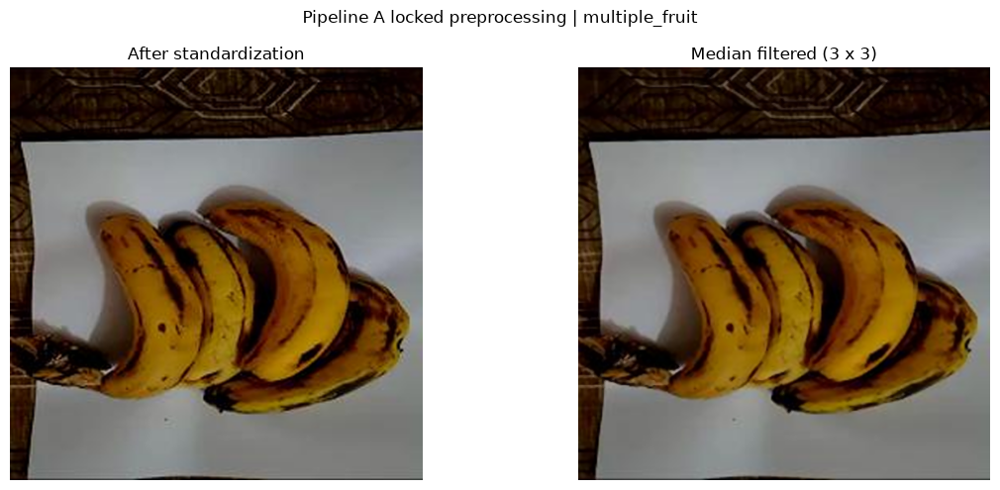

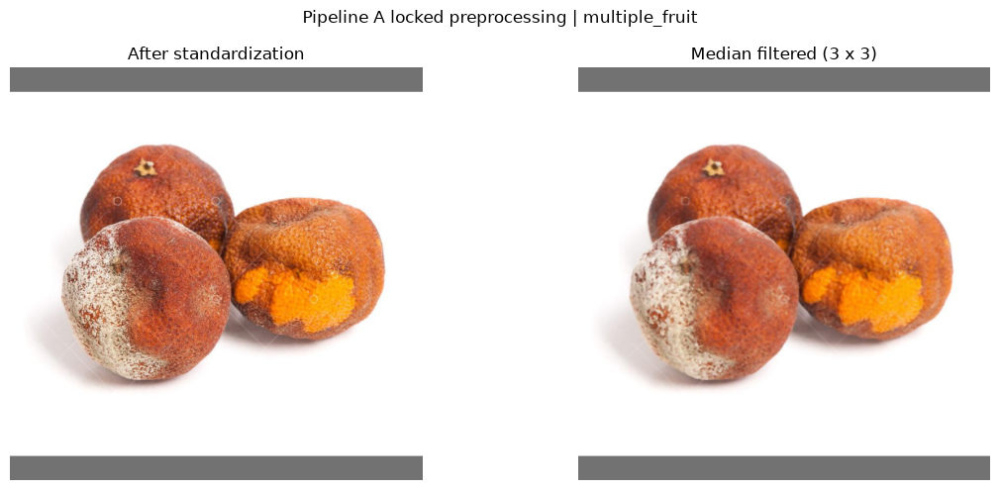

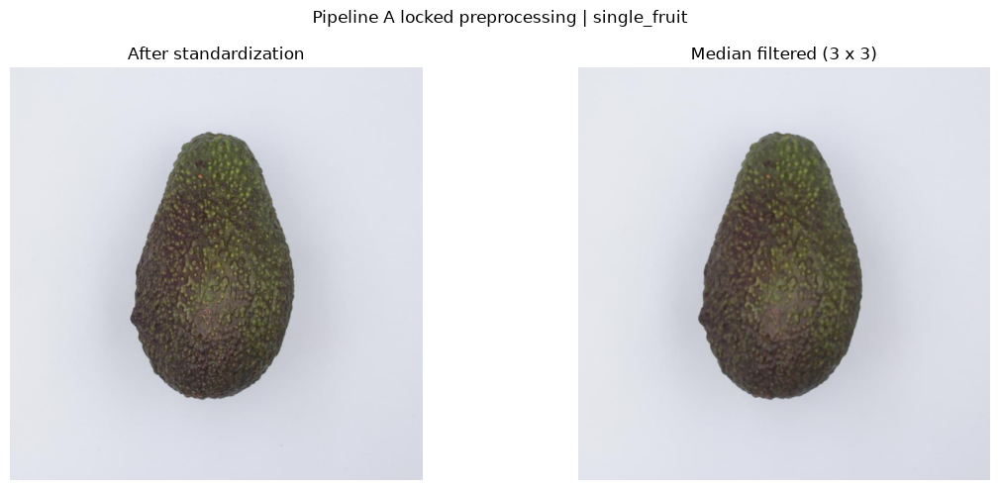

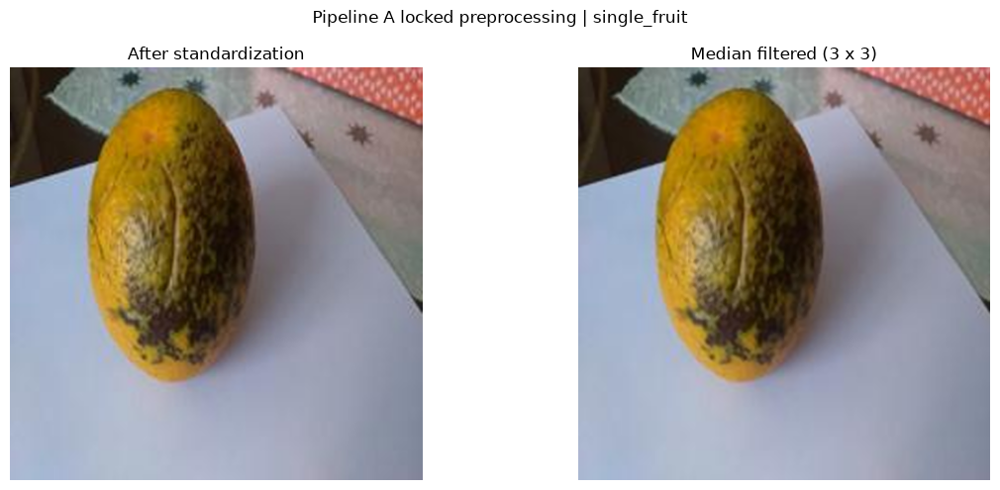

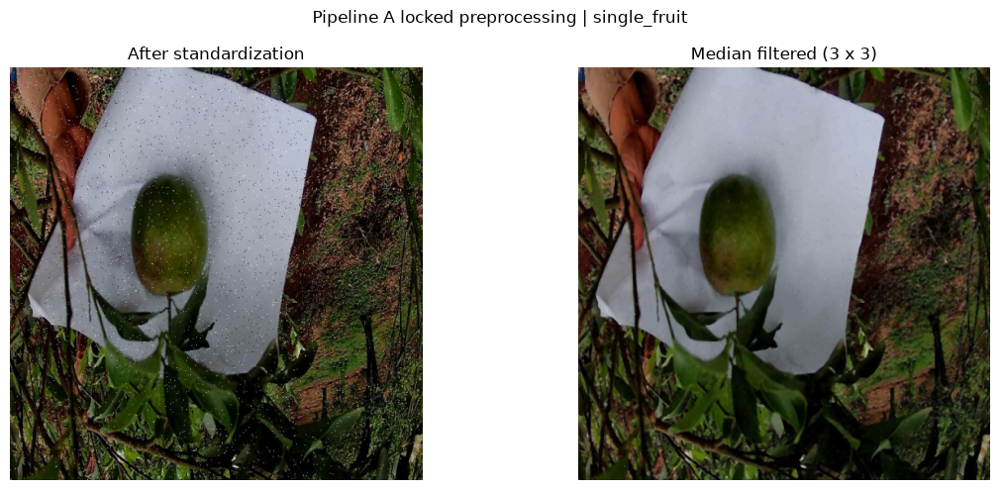

Locked preprocessing complete - train: 38937, validation: 5553
Test images untouched: 6519


In [3]:
# Training Set Processing
from pathlib import Path
import re
from preprocessing.preprocessing_a import preprocess_image

# Load the locked winner kernel from the saved tuning result
PARAMETER_FILE = PROJECT_ROOT / "results" / "pipeline_a" / "preprocessing" / "locked_median_parameter.txt"

with open(PARAMETER_FILE, "r") as file:
    saved_parameter = file.read().strip()

match = re.search(r"(\d+)\s*x\s*\d+", saved_parameter)

if not match:
    raise ValueError("Unable to read Median Filter kernel size from saved file.")

MEDIAN_KERNEL_SIZE = int(match.group(1))

print(f"Loaded locked Median Filter kernel: {MEDIAN_KERNEL_SIZE} x {MEDIAN_KERNEL_SIZE}")

processed_counts = {'train': 0, 'validation': 0}

for split_name, records in (
    ('train', train_records),
    ('validation', validation_records)
):
    for record in records:
        _, standardized, _ = standardize_image(
            record['path'],
            TARGET_SIZE
        )
        if standardized is None:
            continue
        filtered, preprocessing_metadata = preprocess_image(
            standardized,
            MEDIAN_KERNEL_SIZE
        )
        processed_counts[split_name] += 1
        if split_name != 'train' or record['path'] not in train_sample_paths:
            continue
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))
        axes[0].imshow(
            cv2.cvtColor(standardized, cv2.COLOR_BGR2RGB)
        )
        axes[0].set_title('After standardization')

        axes[1].imshow(
            cv2.cvtColor(filtered, cv2.COLOR_BGR2RGB)
        )
        axes[1].set_title(
            f"Median filtered ({MEDIAN_KERNEL_SIZE} x {MEDIAN_KERNEL_SIZE})"
        )
        for axis in axes:
            axis.axis('off')

        fig.suptitle(
            f"Pipeline A locked preprocessing | {record['fruit_group']}"
        )
        plt.tight_layout()
        plt.show()

print(
    f"Locked preprocessing complete - "
    f"train: {processed_counts['train']}, "
    f"validation: {processed_counts['validation']}"
)

print(f"Test images untouched: {len(test_records)}")

## Stage 4 - Segmentation

**Technique:** Threshold-Based Segmentation  
**Algorithm:** Otsu Thresholding  

Otsu Thresholding automatically determines an optimal threshold from each image histogram to separate fruit foreground from background. The validation set is used for evaluation, no manual threshold parameter tuning is required.

**Supporting Article:**  
Asadi et al. (2024) applied Otsu thresholding for kiwifruit image analysis. 
DOI: https://doi.org/10.1186/s12870-023-04661-6 

**Evaluation Metrics:**

| Metric | Purpose | Better |
|---|---|---|
| Boundary Edge Alignment | Fruit boundary alignment with image edges | ↑ Higher |
| Region Uniformity | Consistency of the segmented fruit region | ↑ Higher |
| Foreground–Background Contrast | Separation between fruit and background | ↑ Higher |
| Processing Time | Segmentation efficiency | ↓ Lower |

No pixel-level ground-truth masks are available, so IoU, Dice, and pixel accuracy are not calculated.

The average validation results are used to evaluate the Otsu segmentation performance and later compare it with the segmentation algorithm used in Pipeline B.

**Evaluation Metric References:**  
FBSM: Foveabox-based boundary-aware segmentation method for green apples in natural orchards — Jia et al. (2025)  
DOI: [https://doi.org/10.1016/j.eswa.2024.125426](https://doi.org/10.1016/j.eswa.2024.125426)  
Supports: Boundary Edge Alignment / fruit boundary quality

Image denoising and segmentation model construction based on IWOA-PCNN — Zhang (2023)  
DOI: [https://doi.org/10.1038/s41598-023-47089-6](https://doi.org/10.1038/s41598-023-47089-6)  
Supports: Region Uniformity and Processing Time

Robust plant segmentation of color images based on image contrast optimization — Lu et al. (2022)  
DOI: [https://doi.org/10.1016/j.compag.2022.106711](https://doi.org/10.1016/j.compag.2022.106711)  
Supports: Foreground–Background Contrast / separability 

Research on watermelon fruit extraction from UAV images based on semantic segmentation — Qiu et al. (2024)  
DOI: [https://doi.org/10.13733/j.jcam.issn.2095-5553.2024.03.025](https://doi.org/10.13733/j.jcam.issn.2095-5553.2024.03.025)  
Supports: Processing Time / segmentation efficiency

In [4]:
# Reuse the established standardization and locked Median Filter setting.
import re
from preprocessing.preprocessing_a import preprocess_image
import segmentation.segmentation_a as segmentation_a
import evaluation.segmentation_metrics as segmentation_metrics
importlib.reload(segmentation_a)
importlib.reload(segmentation_metrics)
from segmentation.segmentation_a import segment_image
from evaluation.segmentation_metrics import evaluate_segmentation
from preprocessing.preprocessing_a import preprocess_image

PARAMETER_FILE = PROJECT_ROOT / 'results' / 'pipeline_a' / 'preprocessing' / 'locked_median_parameter.txt'
match = re.search(r'(\d+)\s*x\s*\d+', PARAMETER_FILE.read_text(encoding='utf-8'))
if not match:
    raise ValueError('Unable to read locked Median Filter kernel size.')
MEDIAN_KERNEL_SIZE = int(match.group(1))
SEGMENTATION_RESULTS_DIR = PROJECT_ROOT / 'results' / 'pipeline_a' / 'segmentation'
SEGMENTATION_RESULTS_DIR.mkdir(parents=True, exist_ok=True)
print(f'Using locked Median Filter kernel: {MEDIAN_KERNEL_SIZE} x {MEDIAN_KERNEL_SIZE}')
print(f'Validation images for segmentation: {len(validation_records)}')
print(f'Test images untouched: {len(test_records)}')

Using locked Median Filter kernel: 3 x 3
Validation images for segmentation: 5553
Test images untouched: 6519


In [14]:
# Evaluate Otsu Thresholding on every readable VALIDATION image only.
SEGMENTATION_RESULTS_DIR = PROJECT_ROOT / 'results' / 'pipeline_a' / 'segmentation'
SEGMENTATION_RESULTS_DIR.mkdir(parents=True, exist_ok=True)
segmentation_rows = []
skipped_segmentation_images = 0
for index, record in enumerate(validation_records, start=1):
    _, standardized, _ = standardize_image(record['path'], TARGET_SIZE)
    if standardized is None:
        skipped_segmentation_images += 1
        continue
    try:
        median_filtered, _ = preprocess_image(standardized, MEDIAN_KERNEL_SIZE)
        mask, metadata, processing_time_seconds = segment_image(median_filtered)
        scores = evaluate_segmentation(median_filtered, mask, processing_time_seconds)
    except Exception as error:
        skipped_segmentation_images += 1
        print(f"Skipped segmentation for {record['path']}: {error}")
        continue
    segmentation_rows.append({
        'image_path': str(record['path']), 'fruit_group': record['fruit_group'],
        'otsu_threshold': metadata['otsu_threshold'],
        'boundary_edge_alignment': scores['boundary_edge_alignment'],
        'region_uniformity': scores['region_uniformity'],
        'foreground_background_contrast': scores['foreground_background_contrast'],
        'processing_time_ms': scores['processing_time_ms'],
    })
    if index % 100 == 0:
        print(f'Segmentation validation images processed: {index}/{len(validation_records)}')
if not segmentation_rows:
    raise RuntimeError('No validation images were successfully evaluated for Otsu Thresholding.')
SEGMENTATION_RESULTS_DIR.mkdir(parents=True, exist_ok=True)
otsu_validation_results = pd.DataFrame(segmentation_rows)
otsu_validation_results.to_csv(SEGMENTATION_RESULTS_DIR / 'otsu_validation_results.csv', index=False)
otsu_summary = pd.DataFrame([{
    'Algorithm': 'Otsu Thresholding', 'Images Evaluated': len(otsu_validation_results),
    'Avg Boundary Edge Alignment ↑': otsu_validation_results['boundary_edge_alignment'].mean(),
    'Avg Region Uniformity ↑': otsu_validation_results['region_uniformity'].mean(),
    'Avg Foreground–Background Contrast ↑': otsu_validation_results['foreground_background_contrast'].mean(),
    'Avg Time (ms) ↓': otsu_validation_results['processing_time_ms'].mean(),
    'Avg Otsu Threshold': otsu_validation_results['otsu_threshold'].mean(),
    'Skipped/Unreadable Images': skipped_segmentation_images,
}])
otsu_summary.to_csv(SEGMENTATION_RESULTS_DIR / 'otsu_summary.csv', index=False)
display(otsu_summary.round({'Avg Boundary Edge Alignment ↑': 4, 'Avg Region Uniformity ↑': 4, 'Avg Foreground–Background Contrast ↑': 4, 'Avg Time (ms) ↓': 3, 'Avg Otsu Threshold': 2}))
print(f'Successfully evaluated images: {len(otsu_validation_results)}')
print(f'Skipped/unreadable images: {skipped_segmentation_images}')
print(f"Saved per-image results: {SEGMENTATION_RESULTS_DIR / 'otsu_validation_results.csv'}")
print(f"Saved summary: {SEGMENTATION_RESULTS_DIR / 'otsu_summary.csv'}")

Segmentation validation images processed: 100/5553
Segmentation validation images processed: 200/5553
Segmentation validation images processed: 300/5553
Segmentation validation images processed: 400/5553
Segmentation validation images processed: 500/5553
Segmentation validation images processed: 600/5553
Segmentation validation images processed: 700/5553
Segmentation validation images processed: 800/5553
Segmentation validation images processed: 900/5553
Segmentation validation images processed: 1000/5553
Segmentation validation images processed: 1100/5553
Segmentation validation images processed: 1200/5553
Segmentation validation images processed: 1300/5553
Segmentation validation images processed: 1400/5553
Segmentation validation images processed: 1500/5553
Segmentation validation images processed: 1600/5553
Segmentation validation images processed: 1700/5553
Segmentation validation images processed: 1800/5553
Segmentation validation images processed: 1900/5553
Segmentation validati

,Algorithm,Images Evaluated,Avg Boundary Edge Alignment ↑,Avg Region Uniformity ↑,Avg Foreground–Background Contrast ↑,Avg Time (ms) ↓,Avg Otsu Threshold,Skipped/Unreadable Images
0,Otsu Thresholding,5553,0.4487,0.8269,0.3757,0.288,120.15,0


Successfully evaluated images: 5553
Skipped/unreadable images: 0
Saved per-image results: c:\Users\Hwang\Documents\GitHub\IP-Asignment\results\pipeline_a\segmentation\otsu_validation_results.csv
Saved summary: c:\Users\Hwang\Documents\GitHub\IP-Asignment\results\pipeline_a\segmentation\otsu_summary.csv


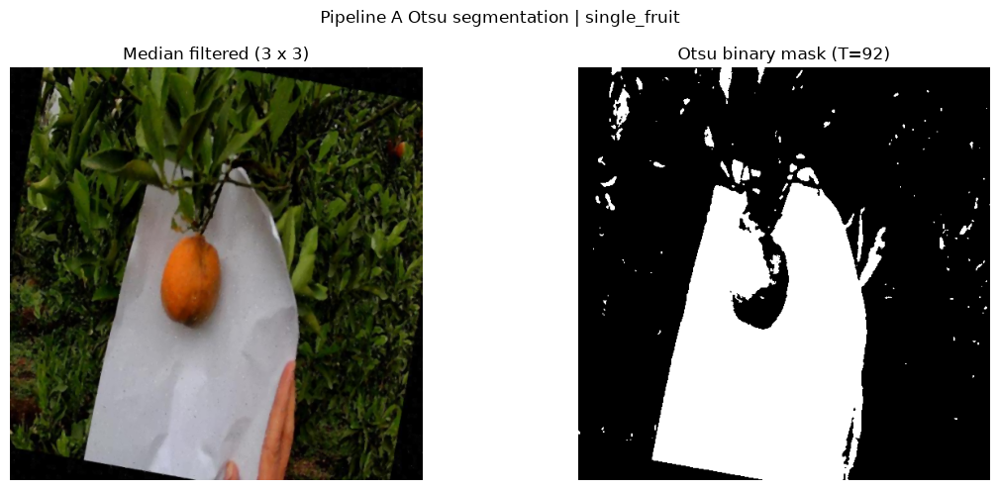

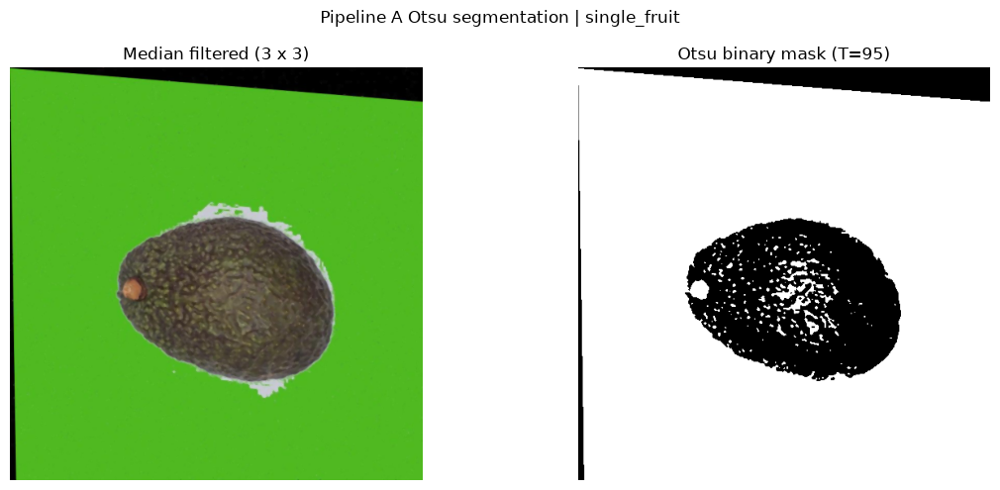

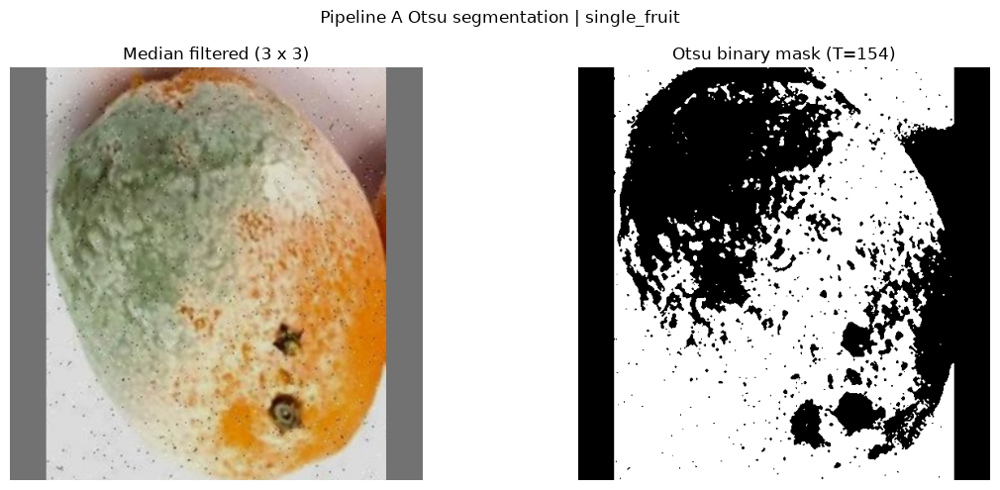

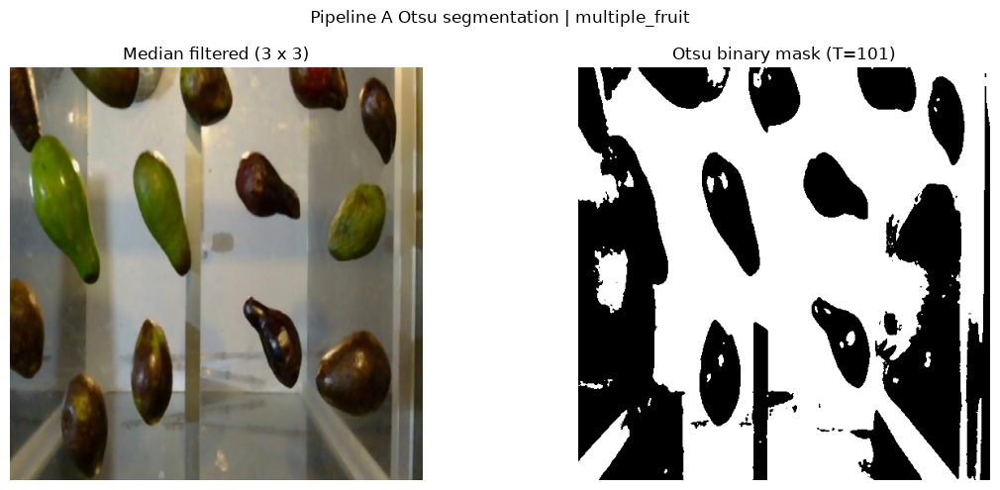

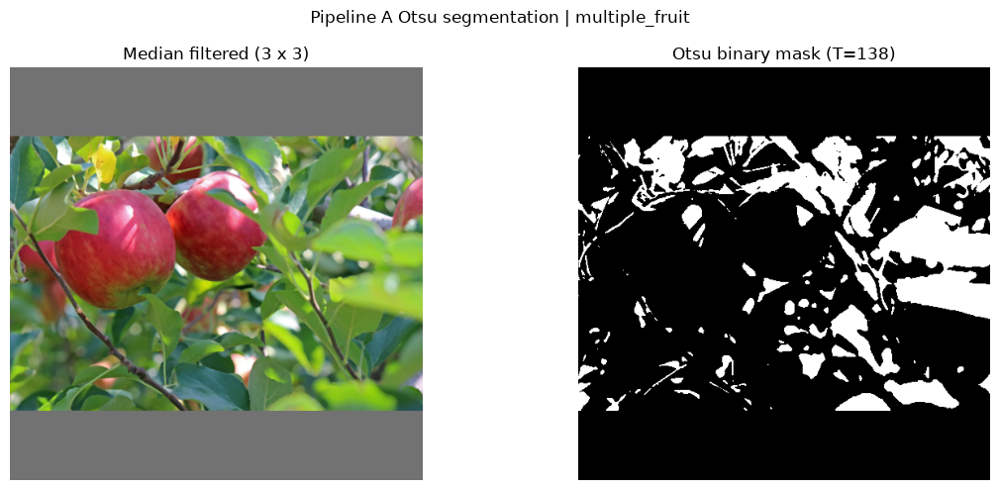

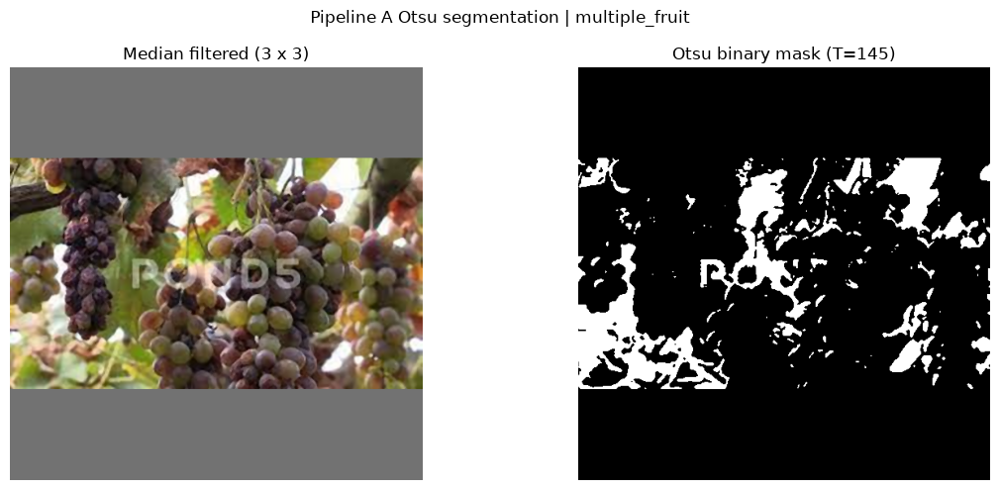

In [5]:
# Small, reproducible validation sample: 3 single-fruit and 3 multiple-fruit images.
for record in get_sample_images(validation_records, single_count=3, multiple_count=3, seed=42):
    _, standardized, _ = standardize_image(record['path'], TARGET_SIZE)
    if standardized is None:
        continue
    median_filtered, _ = preprocess_image(standardized, MEDIAN_KERNEL_SIZE)
    mask, metadata, _ = segment_image(median_filtered)
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(cv2.cvtColor(median_filtered, cv2.COLOR_BGR2RGB))
    axes[0].set_title(f'Median filtered ({MEDIAN_KERNEL_SIZE} x {MEDIAN_KERNEL_SIZE})')
    axes[1].imshow(mask, cmap='gray', vmin=0, vmax=255)
    axes[1].set_title(f"Otsu binary mask (T={metadata['otsu_threshold']:.0f})")
    for axis in axes:
        axis.axis('off')
    fig.suptitle(f"Pipeline A Otsu segmentation | {record['fruit_group']}")
    plt.tight_layout()
    plt.show()

In [ ]:
# Training Set Processing
train_segmentation_rows = []
skipped_train_segmentation_images = 0
for index, record in enumerate(train_records, start=1):
    _, standardized, _ = standardize_image(record["path"], TARGET_SIZE)
    if standardized is None:
        skipped_train_segmentation_images += 1
        continue
    try:
        median_filtered, _ = preprocess_image(standardized, MEDIAN_KERNEL_SIZE)
        mask, metadata, processing_time_seconds = segment_image(median_filtered)
    except Exception as error:
        skipped_train_segmentation_images += 1
        print(f"Skipped train segmentation for {record['path']}: {error}")
        continue
    train_segmentation_rows.append({"image_path": str(record["path"]), "fruit_group": record["fruit_group"], "otsu_threshold": metadata["otsu_threshold"], "processing_time_ms": processing_time_seconds * 1000})
    if index % 100 == 0:
        print(f"Training images segmented: {index}/{len(train_records)}")
print(f"Successfully segmented training images: {len(train_segmentation_rows)}")
print(f"Skipped/unreadable training images: {skipped_train_segmentation_images}")

Training images segmented: 100/38937
Training images segmented: 200/38937
Training images segmented: 300/38937
Training images segmented: 400/38937
Training images segmented: 500/38937
Training images segmented: 600/38937
Training images segmented: 700/38937
Training images segmented: 800/38937
Training images segmented: 900/38937
Training images segmented: 1000/38937
Training images segmented: 1100/38937
Training images segmented: 1200/38937
Training images segmented: 1300/38937
Training images segmented: 1400/38937
Training images segmented: 1500/38937
Training images segmented: 1600/38937
Training images segmented: 1700/38937
Training images segmented: 1800/38937
Training images segmented: 1900/38937
Training images segmented: 2000/38937
Training images segmented: 2100/38937
Training images segmented: 2200/38937
Training images segmented: 2300/38937
Training images segmented: 2400/38937
Training images segmented: 2500/38937
Training images segmented: 2600/38937
Training images segme

## Stage 5 - Morphological Processing
**Technique:** Morphological Processing  
**Algorithm:** Opening  

Morphological opening (erosion followed by dilation) removes small isolated foreground noise from the Otsu binary mask while preserving the main fruit regions. This follows Asadi et al. (2024) for kiwifruit image analysis. A fixed 3 × 3 elliptical structuring element is used; no additional parameter tuning is performed.

The Morphological Opening structuring-element size is tuned using 3 × 3 and 5 × 5 kernels on the validation set. The 3 × 3 kernel is included because recent apple-image research used a small 3 × 3 structuring element to suppress noise while preserving fruit shape characteristics. The 5 × 5 kernel is tested as a moderately larger alternative that can remove stronger or larger foreground noise. Comparing both sizes allows the study to determine whether lighter mask refinement or stronger noise removal is more suitable for the fruit dataset without excessively damaging fruit boundaries.

**Supporting Article:**  
Asadi et al. (2024) applied morphological opening for kiwifruit image analysis. DOI: https://doi.org/10.1186/s12870-023-04661-6 

Wang, Lu & Du (2025) Research on apple size grading based on LabVIEW and yolo algorithm. DOI: https://doi.org/10.1007/s44163-025-00545-w

**Evaluation Metrics:**

| Metric | Purpose | Better |
|---|---|---|
| Boundary Edge Alignment | Preservation of fruit boundary alignment after refinement | ↑ Higher |
| Region Uniformity | Consistency of the refined fruit region | ↑ Higher |
| Foreground–Background Contrast | Separation between fruit and background after refinement | ↑ Higher |
| Processing Time | Morphological processing efficiency | ↓ Lower |

The average validation results are used to compare the 3 × 3 and 5 × 5 Morphological Opening kernels and select the final configuration.

**Evaluation Metric References:**  
FBSM: Foveabox-based boundary-aware segmentation method for green apples in natural orchards — Jia et al. (2025)  
DOI: [https://doi.org/10.1016/j.eswa.2024.125426](https://doi.org/10.1016/j.eswa.2024.125426)  
Supports: Boundary Edge Alignment / fruit boundary quality


Image denoising and segmentation model construction based on IWOA-PCNN — Zhang (2023)  
DOI: [https://doi.org/10.1038/s41598-023-47089-6](https://doi.org/10.1038/s41598-023-47089-6)  
Supports: Region Uniformity and Processing Time


Robust plant segmentation of color images based on image contrast optimization — Lu et al. (2022)  
DOI: [https://doi.org/10.1016/j.compag.2022.106711](https://doi.org/10.1016/j.compag.2022.106711)  
Supports: Foreground–Background Contrast / separability


Research on watermelon fruit extraction from UAV images based on semantic segmentation — Qiu et al. (2024)  
DOI: [https://doi.org/10.13733/j.jcam.issn.2095-5553.2024.03.025](https://doi.org/10.13733/j.jcam.issn.2095-5553.2024.03.025)  
Supports: Processing Time / segmentation efficiency

In [7]:
# Tune Morphological Opening (ELLIPSE) on validation images only.
from morphology.morphology_a import apply_morphological_opening
MORPHOLOGY_RESULTS_DIR = PROJECT_ROOT / "results" / "pipeline_a" / "morphology"
MORPHOLOGY_RESULTS_DIR.mkdir(parents=True, exist_ok=True)
rows = []
for index, record in enumerate(validation_records, start=1):
    _, standardized, _ = standardize_image(record["path"], TARGET_SIZE)
    if standardized is None: continue
    filtered, _ = preprocess_image(standardized, MEDIAN_KERNEL_SIZE)
    otsu_mask, _, _ = segment_image(filtered)
    for size in (3, 5):
        opened, meta, elapsed = apply_morphological_opening(otsu_mask, size, "ellipse")
        try: scores = evaluate_segmentation(filtered, opened, elapsed)
        except ValueError: continue
        rows.append({"image_path": str(record["path"]), "fruit_group": record["fruit_group"], "kernel_size": size, **scores})
    if index % 100 == 0: print(f"Morphology validation images processed: {index}/{len(validation_records)}")
per_image = pd.DataFrame(rows)
summary = per_image.groupby("kernel_size").agg(images_evaluated=("image_path", "count"), boundary_edge_alignment=("boundary_edge_alignment", "mean"), region_uniformity=("region_uniformity", "mean"), foreground_background_contrast=("foreground_background_contrast", "mean"), processing_time_ms=("processing_time_ms", "mean")).reset_index()
summary.columns = ["Opening Kernel", "Images Evaluated", "Avg Boundary Edge Alignment ↑", "Avg Region Uniformity ↑", "Avg Foreground–Background Contrast ↑", "Avg Time (ms) ↓"]
summary.to_csv(MORPHOLOGY_RESULTS_DIR / "morphological_opening_tuning_results.csv", index=False)
rank_source = summary.set_index("Opening Kernel")[["Avg Boundary Edge Alignment ↑", "Avg Region Uniformity ↑", "Avg Foreground–Background Contrast ↑", "Avg Time (ms) ↓"]]
ranks = rank_source.rank(ascending=[False, False, False, True])
ranks["balanced_average_rank"] = ranks.mean(axis=1)
ranks.to_csv(MORPHOLOGY_RESULTS_DIR / "morphological_opening_ranking.csv")
MORPHOLOGY_KERNEL_SIZE = int(ranks["balanced_average_rank"].idxmin())
(MORPHOLOGY_RESULTS_DIR / "locked_morphology_parameter.txt").write_text(f"Morphological Operation: Opening\\nStructuring Element Shape: Ellipse\\nStructuring Element Size: {MORPHOLOGY_KERNEL_SIZE} x {MORPHOLOGY_KERNEL_SIZE}\\n", encoding="utf8")
display(summary.round(4)); print(f"Locked Morphological Opening kernel: {MORPHOLOGY_KERNEL_SIZE} × {MORPHOLOGY_KERNEL_SIZE}")


Morphology validation images processed: 100/5553
Morphology validation images processed: 200/5553
Morphology validation images processed: 300/5553
Morphology validation images processed: 400/5553
Morphology validation images processed: 500/5553
Morphology validation images processed: 600/5553
Morphology validation images processed: 700/5553
Morphology validation images processed: 800/5553
Morphology validation images processed: 900/5553
Morphology validation images processed: 1000/5553
Morphology validation images processed: 1100/5553
Morphology validation images processed: 1200/5553
Morphology validation images processed: 1300/5553
Morphology validation images processed: 1400/5553
Morphology validation images processed: 1500/5553
Morphology validation images processed: 1600/5553
Morphology validation images processed: 1700/5553
Morphology validation images processed: 1800/5553
Morphology validation images processed: 1900/5553
Morphology validation images processed: 2000/5553
Morpholog

,Opening Kernel,Images Evaluated,Avg Boundary Edge Alignment ↑,Avg Region Uniformity ↑,Avg Foreground–Background Contrast ↑,Avg Time (ms) ↓
0,3,5553,0.4521,0.8274,0.3758,0.0750
1,5,5553,0.4595,0.8288,0.3757,0.1321


Locked Morphological Opening kernel: 3 × 3


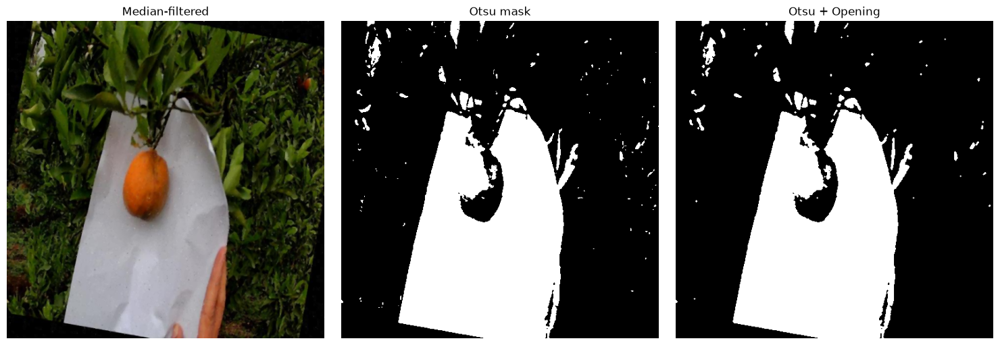

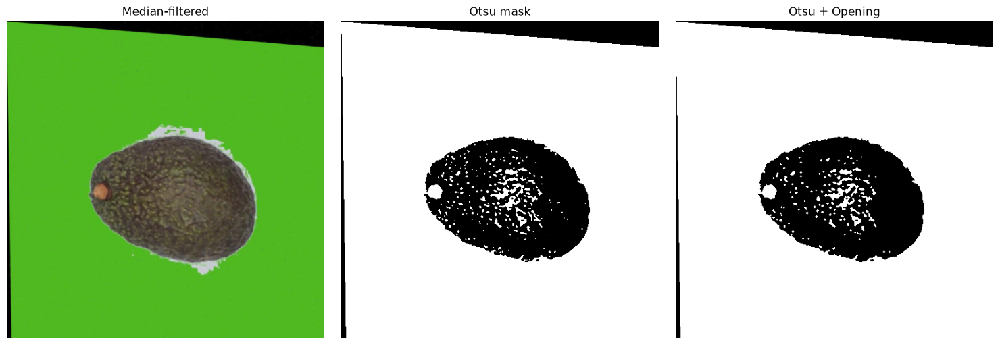

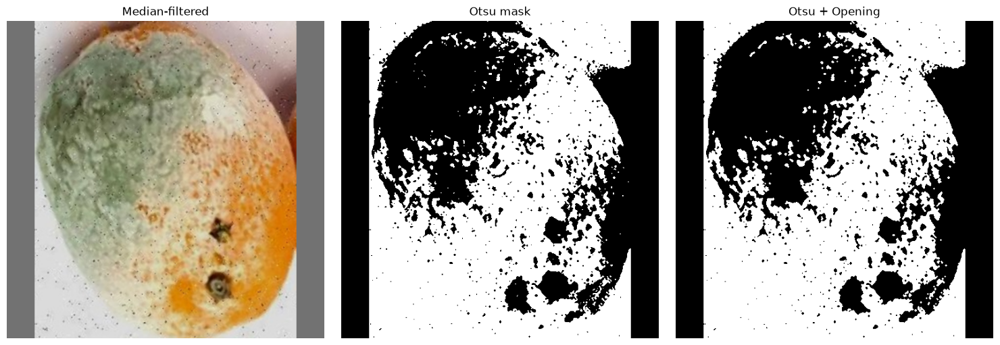

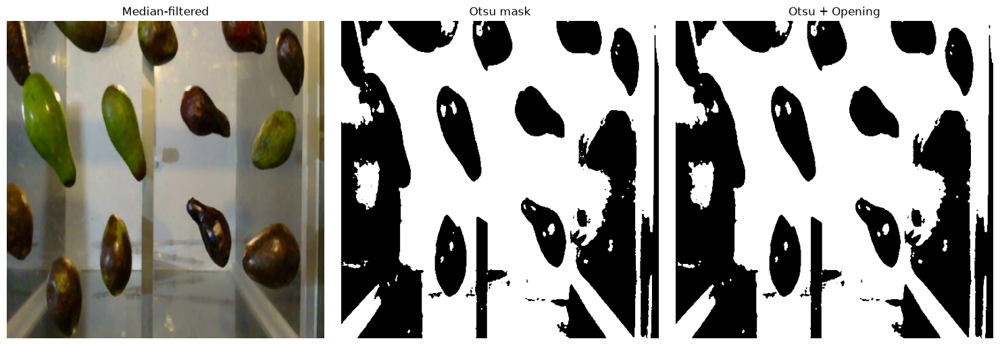

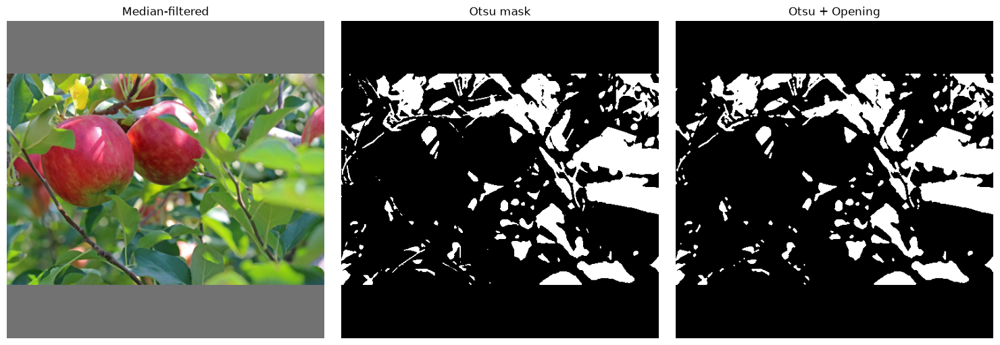

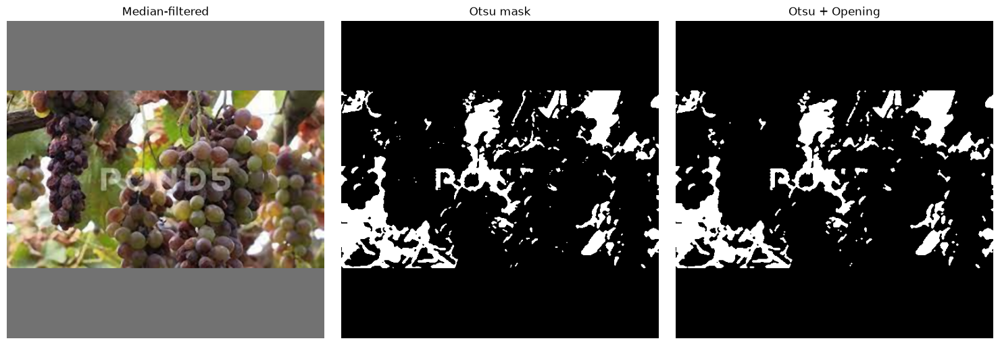

In [8]:
# Median-filtered image | Otsu mask | Otsu + locked Morphological Opening.
for record in get_sample_images(validation_records, single_count=3, multiple_count=3, seed=42):
    _, standardized, _ = standardize_image(record["path"], TARGET_SIZE)
    if standardized is None: continue
    filtered, _ = preprocess_image(standardized, MEDIAN_KERNEL_SIZE)
    mask, _, _ = segment_image(filtered)
    opened, _, _ = apply_morphological_opening(mask, MORPHOLOGY_KERNEL_SIZE, "ellipse")
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(cv2.cvtColor(filtered, cv2.COLOR_BGR2RGB)); axes[0].set_title("Median-filtered")
    axes[1].imshow(mask, cmap="gray", vmin=0, vmax=255); axes[1].set_title("Otsu mask")
    axes[2].imshow(opened, cmap="gray", vmin=0, vmax=255); axes[2].set_title("Otsu + Opening")
    for axis in axes: axis.axis("off")
    plt.tight_layout(); plt.show()

In [9]:
# Training Set Processing
import re
from morphology.morphology_a import apply_morphological_opening
MORPHOLOGY_RESULTS_DIR = PROJECT_ROOT / "results" / "pipeline_a" / "morphology"
LOCKED_MORPHOLOGY_FILE = MORPHOLOGY_RESULTS_DIR / "locked_morphology_parameter.txt"
locked_text = LOCKED_MORPHOLOGY_FILE.read_text(encoding="utf8")
match = re.search(r"(\d+)\s*x\s*\d+", locked_text)
if not match: raise ValueError("Unable to read locked morphology kernel size.")
MORPHOLOGY_KERNEL_SIZE = int(match.group(1))
MORPHOLOGY_KERNEL_SHAPE = "ellipse"
train_morphology_masks = []
skipped_train_morphology = 0
for index, record in enumerate(train_records, start=1):
    _, standardized, _ = standardize_image(record["path"], TARGET_SIZE)
    if standardized is None:
        skipped_train_morphology += 1
        continue
    filtered, _ = preprocess_image(standardized, MEDIAN_KERNEL_SIZE)
    otsu_mask, _, _ = segment_image(filtered)
    opened_mask, _, _ = apply_morphological_opening(otsu_mask, MORPHOLOGY_KERNEL_SIZE, MORPHOLOGY_KERNEL_SHAPE)
    train_morphology_masks.append((record, opened_mask))
    if index % 100 == 0: print(f"Morphology training images processed: {index}/{len(train_records)}")
print(f"Loaded winner: {MORPHOLOGY_KERNEL_SIZE} x {MORPHOLOGY_KERNEL_SIZE} ({MORPHOLOGY_KERNEL_SHAPE.title()})")
print(f"Training images ready after locked opening: {len(train_morphology_masks)}")
print(f"Skipped/unreadable training images: {skipped_train_morphology}")

Morphology training images processed: 100/38937
Morphology training images processed: 200/38937
Morphology training images processed: 300/38937
Morphology training images processed: 400/38937
Morphology training images processed: 500/38937
Morphology training images processed: 600/38937
Morphology training images processed: 700/38937
Morphology training images processed: 800/38937
Morphology training images processed: 900/38937
Morphology training images processed: 1000/38937
Morphology training images processed: 1100/38937
Morphology training images processed: 1200/38937
Morphology training images processed: 1300/38937
Morphology training images processed: 1400/38937
Morphology training images processed: 1500/38937
Morphology training images processed: 1600/38937
Morphology training images processed: 1700/38937
Morphology training images processed: 1800/38937
Morphology training images processed: 1900/38937
Morphology training images processed: 2000/38937
Morphology training images pr

## Stage 6 - Fruit Detection